# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

## Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Background
The client is a used car dealership, with an interest in better understanding what is important to a buyer, in order to better inform pricing and promotion.

### Business Objectives
Since we can't actually interview the client, here are some of the possible business objectives which this effort might achieve.
1. Sell more cars
2. Sell cars more quickly to reduce lot inventory costs and depreciation
3. Increase profit margin on sale
4. Decrease cost of purchase
5. Improve promotion effectiveness by advertising what buyers are looking for.
6. Improve customer satisfaction
7. Improve retention / repeat buyers
8. Increase sales agent productivity / retention

### Business success criteria
Possible metrics and goals associated with each business objective
1. Increase total #cars sold
2. Decrease average time on lot
3. Increase average profit per sale
4. Decrease average purchase price on intake
5. Improve promotional effectiveness (channel dependent metric)
6. Increase post sale customer satisfaction at +1 week, +1 month, +1 year
7. Increase percentage of buyers who repeat
8. Increase average revenue / profit / commission per agent.  Increase average agent tenure



## Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

### Data Objectives derived from Business Understanding

1. Determine the relative importance of factors (columns) affecting the prices of used cars in the USA.
2. Examine regional variation.  Develop hypotheses about any subsetting necessary to restrict the training set to increase relevance for this client.
2. Build and test models which can be used to predict the price of additional cars given the named factors.
3. Use the best predictive models to build hypotheses about consumer prefences.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

### Data Preparation / Inspection
1. Inspect the data.  Look for completeness of the dataset.  
2. Fill in or drop data as needed to create consistency for data analysis
3. Remove redundant columns
4. Encode categorical columns to enable numeric analysis
5. Apply any needed subsetting to use only relevant data
6. Determine cross-validation strategy and create training / test subsets

In [142]:
# import the necessary packages
from statsmodels.tsa.seasonal import seasonal_decompose

import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib inline 

import pandas as pd
import numpy as np

import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.filters.filtertools import convolution_filter
import statsmodels.graphics.tsaplots as tsaplots
from statsmodels.tsa.seasonal import _extrapolate_trend
from sklearn.linear_model import LinearRegression

In [25]:
# load the data
df = pd.read_csv('data/vehicles.csv')

In [26]:
df

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy


In [16]:
#describe the data
df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [17]:
#count the number of missing values in the dataset
df.isnull().sum()


id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [198]:
# conside dropping the rows with missing values
df_nonull = df.dropna()
lost_rows = df.count().max() - df_nonull.count().max()
print(f"Lost rows: {lost_rows}")
print(f"resulting rows: {df_nonull.count().max()}")

Lost rows: 392012
resulting rows: 34868


In [199]:
# get the count of rows with 'price' equal to 0
zero_price_rows = df_nonull[df_nonull['price'] == 0].count().max()
print(f"Rows with price = 0: {zero_price_rows}")

# drop the rows with 'price' equal to 0
df_nonull = df_nonull[df_nonull['price'] != 0]
print(f"resulting rows: {df_nonull.count().max()}")


Rows with price = 0: 2372
resulting rows: 32496


### Data subset

Although this is a significant reduction in the size of the dataset, 32k records should still be enough to form a representative subset.  If the data looks skewed, I may have to come back and revisit this.

## Redundant Columns

In [208]:
print(df_nonull.info())
df_nonull


<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   id            32496 non-null  int64   
 1   region        32496 non-null  object  
 2   price         32496 non-null  int64   
 3   year          32496 non-null  int64   
 4   manufacturer  32496 non-null  category
 5   model         32496 non-null  object  
 6   condition     32496 non-null  object  
 7   cylinders     32496 non-null  object  
 8   fuel          32496 non-null  object  
 9   odometer      32496 non-null  float64 
 10  title_status  32496 non-null  object  
 11  transmission  32496 non-null  object  
 12  VIN           32496 non-null  object  
 13  drive         32496 non-null  object  
 14  size          32496 non-null  object  
 15  type          32496 non-null  object  
 16  paint_color   32496 non-null  object  
 17  state         32496 non-null  object  
 18  mfr_enco

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state,mfr_encode
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al,38
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al,4
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,clean,automatic,JM1NC25F570128735,rwd,compact,convertible,white,al,25
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,clean,automatic,1FTMF1CM6BKD55331,fwd,full-size,truck,white,al,13
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,clean,automatic,1.14023E+13,rwd,full-size,coupe,silver,al,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,clean,automatic,1FTFX1EF5FFC24427,4wd,full-size,truck,black,wy,13
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,clean,automatic,1G1BE5SM0G7266569,fwd,compact,sedan,silver,wy,7
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,clean,automatic,1FT8W3DT3EEB41548,4wd,full-size,pickup,brown,wy,13
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,clean,automatic,1G1BE5SM7J7133704,fwd,mid-size,sedan,black,wy,7


In [201]:
#convert the date column to four digit integer
df_nonull['year'] = df_nonull['year'].astype(int)
print(df_nonull.info())
df_nonull

<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            32496 non-null  int64  
 1   region        32496 non-null  object 
 2   price         32496 non-null  int64  
 3   year          32496 non-null  int64  
 4   manufacturer  32496 non-null  object 
 5   model         32496 non-null  object 
 6   condition     32496 non-null  object 
 7   cylinders     32496 non-null  object 
 8   fuel          32496 non-null  object 
 9   odometer      32496 non-null  float64
 10  title_status  32496 non-null  object 
 11  transmission  32496 non-null  object 
 12  VIN           32496 non-null  object 
 13  drive         32496 non-null  object 
 14  size          32496 non-null  object 
 15  type          32496 non-null  object 
 16  paint_color   32496 non-null  object 
 17  state         32496 non-null  object 
dtypes: float64(1), int64(3), obj

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,clean,automatic,JM1NC25F570128735,rwd,compact,convertible,white,al
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,clean,automatic,1FTMF1CM6BKD55331,fwd,full-size,truck,white,al
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,clean,automatic,1.14023E+13,rwd,full-size,coupe,silver,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,clean,automatic,1FTFX1EF5FFC24427,4wd,full-size,truck,black,wy
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,clean,automatic,1G1BE5SM0G7266569,fwd,compact,sedan,silver,wy
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,clean,automatic,1FT8W3DT3EEB41548,4wd,full-size,pickup,brown,wy
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,clean,automatic,1G1BE5SM7J7133704,fwd,mid-size,sedan,black,wy


### Encode numeric columns


In [203]:
#create a new column which encodes the manufacturer
df_nonull['manufacturer'] = df_nonull['manufacturer'].astype('category')
print(df_nonull.info())
df_numeric

from sklearn.preprocessing import LabelEncoder
manufacturer_le = LabelEncoder()
df_nonull['mfr_encode'] = le.fit_transform(df_nonull['manufacturer'])

<class 'pandas.core.frame.DataFrame'>
Index: 32496 entries, 215 to 426833
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   id            32496 non-null  int64   
 1   region        32496 non-null  object  
 2   price         32496 non-null  int64   
 3   year          32496 non-null  int64   
 4   manufacturer  32496 non-null  category
 5   model         32496 non-null  object  
 6   condition     32496 non-null  object  
 7   cylinders     32496 non-null  object  
 8   fuel          32496 non-null  object  
 9   odometer      32496 non-null  float64 
 10  title_status  32496 non-null  object  
 11  transmission  32496 non-null  object  
 12  VIN           32496 non-null  object  
 13  drive         32496 non-null  object  
 14  size          32496 non-null  object  
 15  type          32496 non-null  object  
 16  paint_color   32496 non-null  object  
 17  state         32496 non-null  object  
 18  mfr_enco

In [117]:
# get the counts by manufacturer
df_nonull['manufacturer'].value_counts()

manufacturer
ford               6956
chevrolet          4872
toyota             2682
honda              1821
nissan             1602
ram                1451
gmc                1355
jeep               1281
dodge               909
subaru              875
bmw                 863
mercedes-benz       804
hyundai             727
volkswagen          717
lexus               581
kia                 572
chrysler            514
cadillac            469
audi                409
mazda               381
buick               359
mitsubishi          323
lincoln             246
acura               240
volvo               238
infiniti            226
pontiac             198
mini                167
rover               158
porsche             135
saturn               97
jaguar               82
mercury              81
fiat                 47
tesla                19
alfa-romeo           15
ferrari               9
harley-davidson       7
datsun                3
aston-martin          3
land rover            2
Nam

In [118]:
#get the counts by state
df_nonull['state'].value_counts()


state
fl    3398
ca    3332
ny    1722
tx    1299
mi    1222
wi    1111
nc    1094
oh    1033
ia    1030
pa    1000
or     984
va     979
tn     863
mn     795
nj     789
co     759
vt     676
ma     656
il     634
id     604
ks     603
az     599
in     565
ky     543
ok     501
sc     449
al     419
ak     403
mo     381
mt     348
wa     312
ct     298
ga     270
nm     238
ri     231
nv     221
hi     207
me     197
nh     192
dc     182
md     161
ut     153
sd     149
ar     145
ne     134
la     133
nd     133
de     109
wv      88
wy      87
ms      65
Name: count, dtype: int64

In [119]:
#get the counts by cylinders
df_nonull['cylinders'].value_counts()

#create a new numeric column which extracts the number of cylinders
df_nonull['num_cyl'] = df_nonull['cylinders'].str.extract('(\d+)').astype(float)

df_nonull


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/737462785.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


In [120]:
#get the counts by condition
df_nonull['condition'].value_counts()

# label encode the condition column
df_nonull['condition'] = df_nonull['condition'].astype('category')
df_nonull['condition_encode'] = le.fit_transform(df_nonull['condition'])
df_nonull

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3116784081.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3116784081.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,drive,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,fwd,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]"
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,rwd,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]"
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,rwd,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]"
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,fwd,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]"
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,rwd,full-size,coupe,silver,al,26,6.0,1,9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,4wd,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]"
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,fwd,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]"
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,4wd,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]"
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,fwd,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]"


In [148]:
# get the counts by color
print(df_nonull['paint_color'].value_counts())

# label encode the color column
df_nonull['paint_color'] = df_nonull['paint_color'].astype('category')
df_nonull['color_encode'] = le.fit_transform(df_nonull['paint_color'])
df_nonull


paint_color
white     9092
black     5994
silver    4483
grey      3989
blue      3141
red       2900
custom     868
green      842
brown      748
yellow     215
orange     152
purple      72
Name: count, dtype: int64


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/4069362594.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/4069362594.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group,type_encode
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]",9
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]",9
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]",2
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]",10
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,full-size,coupe,silver,al,26,6.0,1,9,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]",10
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]",9
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]",8
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]",9


In [136]:
#get the counts by type
df_nonull['type'].value_counts()

# label encode the type column
df_nonull['type'] = df_nonull['type'].astype('category')
df_nonull['type_encode'] = le.fit_transform(df_nonull['type'])
df_nonull


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3693884359.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3693884359.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,...,size,type,paint_color,state,mfr_encode,num_cyl,condition_encode,color_encode,year_group,type_encode
215,7316482063,birmingham,4000,2002,toyota,echo,excellent,4 cylinders,gas,155000.0,...,compact,sedan,blue,al,38,4.0,0,1,"(2000.0, 2005.0]",9
219,7316429417,birmingham,2500,1995,bmw,525i,fair,6 cylinders,gas,110661.0,...,mid-size,sedan,white,al,4,6.0,1,10,"(1990.0, 1995.0]",9
268,7315946365,birmingham,9000,2008,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,...,compact,convertible,white,al,25,4.0,0,10,"(2005.0, 2010.0]",2
337,7315354216,birmingham,8950,2011,ford,f-150,excellent,6 cylinders,gas,164000.0,...,full-size,truck,white,al,13,6.0,0,10,"(2010.0, 2015.0]",10
338,7315349921,birmingham,4000,1972,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,...,full-size,coupe,silver,al,26,6.0,1,9,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,...,full-size,truck,black,wy,13,8.0,3,0,"(2010.0, 2015.0]",10
426788,7303227528,wyoming,12995,2016,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,...,compact,sedan,silver,wy,7,4.0,3,9,"(2015.0, 2020.0]",9
426792,7303114896,wyoming,32999,2014,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,...,full-size,pickup,brown,wy,13,8.0,0,2,"(2010.0, 2015.0]",8
426793,7303112347,wyoming,15999,2018,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,...,mid-size,sedan,black,wy,7,4.0,0,0,"(2015.0, 2020.0]",9


### look for correlations

In [137]:
# create a subset of just the numeric columns
df_numeric = df_nonull.select_dtypes(include=[np.number])
df_numeric

,id,price,year,odometer,mfr_encode,num_cyl,condition_encode,color_encode,type_encode
215,7316482063,4000,2002,155000.0,38,4.0,0,1,9
219,7316429417,2500,1995,110661.0,4,6.0,1,10,9
268,7315946365,9000,2008,56700.0,25,4.0,0,10,2
337,7315354216,8950,2011,164000.0,13,6.0,0,10,10
338,7315349921,4000,1972,88100.0,26,6.0,1,9,3
...,...,...,...,...,...,...,...,...,...
426785,7303314912,23495,2015,146795.0,13,8.0,3,0,10
426788,7303227528,12995,2016,61127.0,7,4.0,3,9,9
426792,7303114896,32999,2014,154642.0,13,8.0,0,2,8
426793,7303112347,15999,2018,36465.0,7,4.0,0,0,9


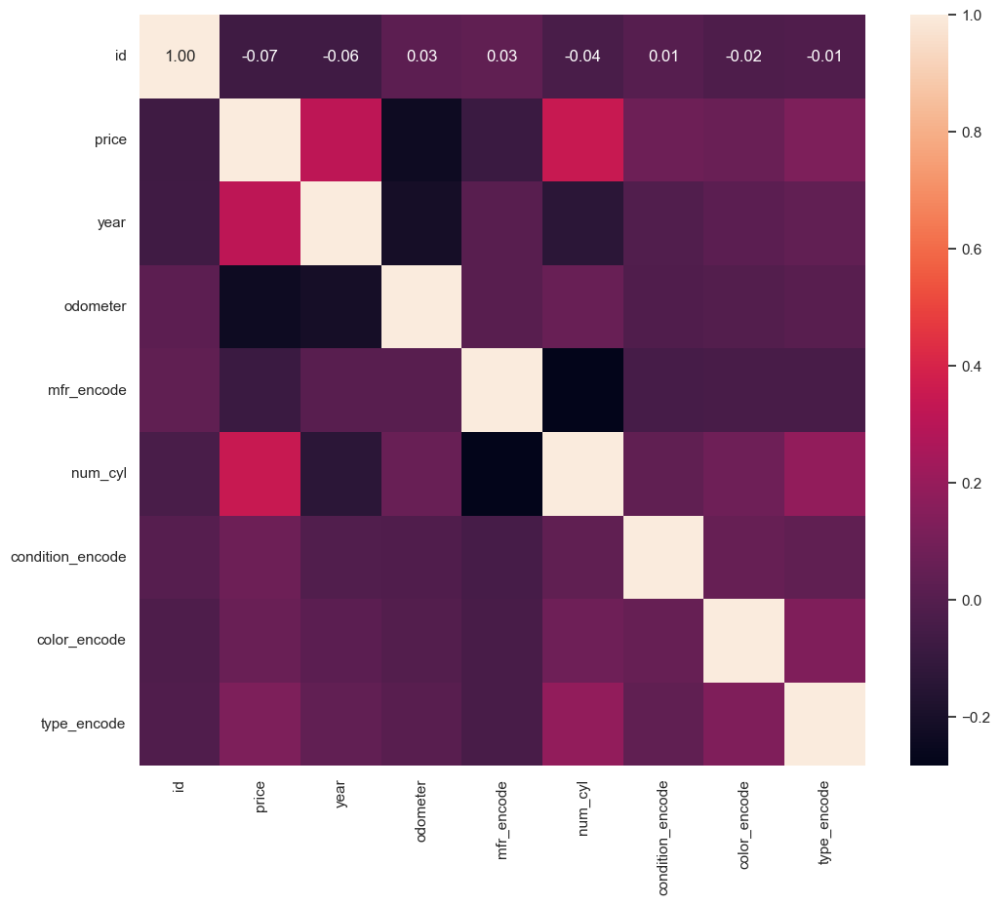

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed

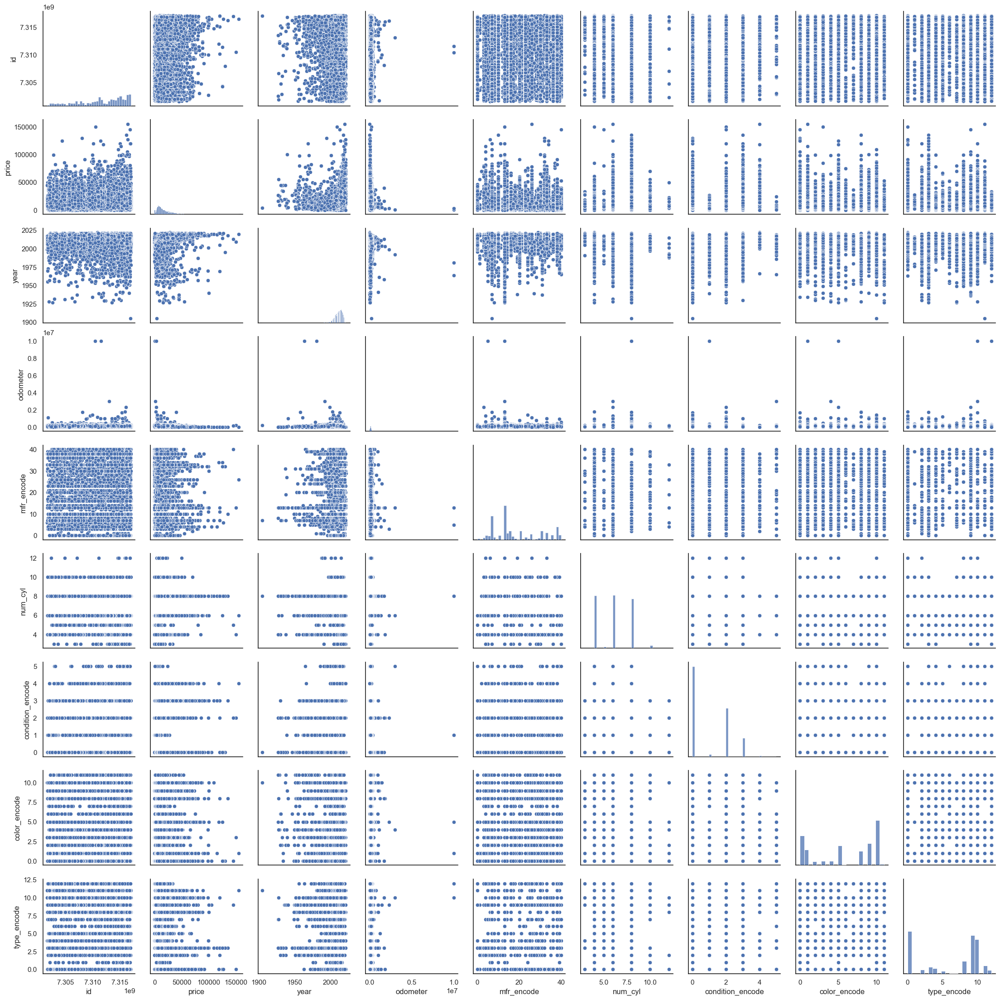

In [138]:
# create the correlation matrix with price
corr_matrix = df_numeric.corr()
corr_matrix['price'].sort_values(ascending=False)

#add the correlation value to each cell in the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f")

plt.show()

# create the pairplot
import seaborn as sns
sns.pairplot(df_numeric)
plt.show()



/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



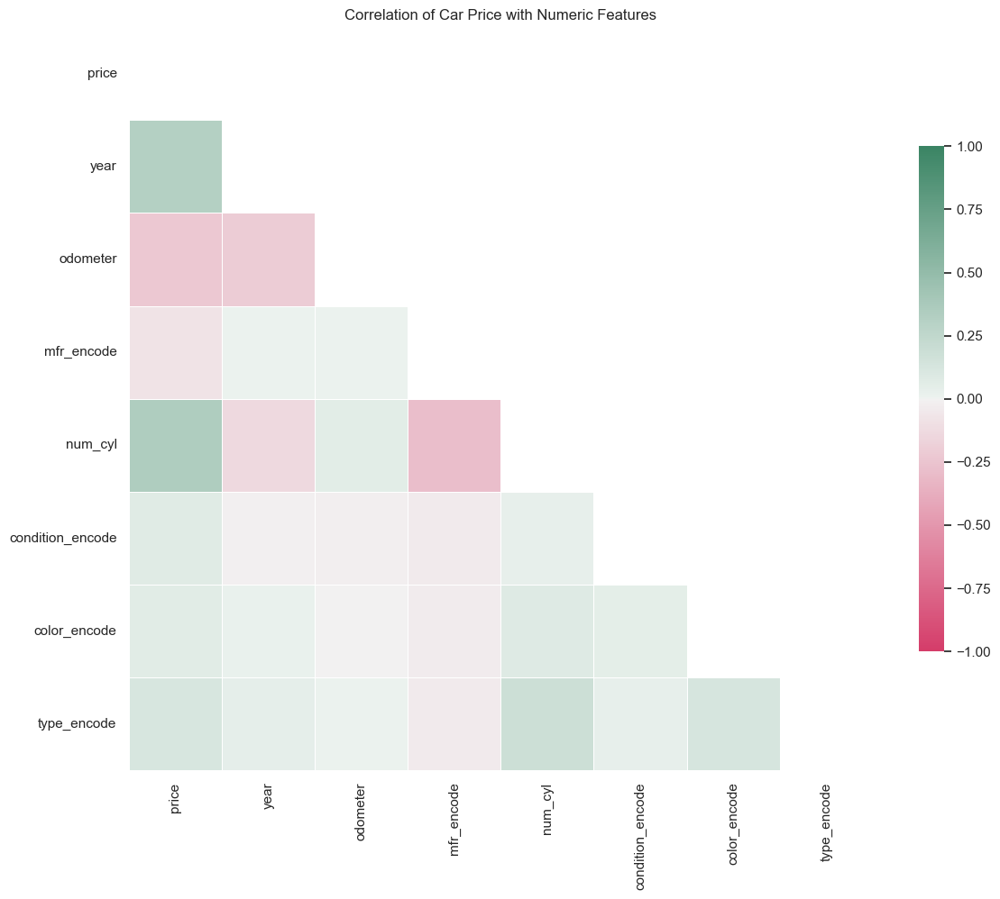

In [147]:
#diagonal heatmap from https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set_theme(style="white")

d = df_numeric.drop('id', axis=1)

# Compute the correlation matrix
corr = d.corr()
corr['price'].sort_values(ascending=False)


# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,12))

# generate a custom diverging colormap from dark red to dark green
cmap = sns.diverging_palette(0, 150, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            fmt=".2f", square=True, linewidths=.5, cbar_kws={"shrink": .5}, cbar=True)
plt.title('Correlation of Car Price with Numeric Features')

plt.tight_layout()
plt.savefig('images/heatmap.jpg')
plt.show()

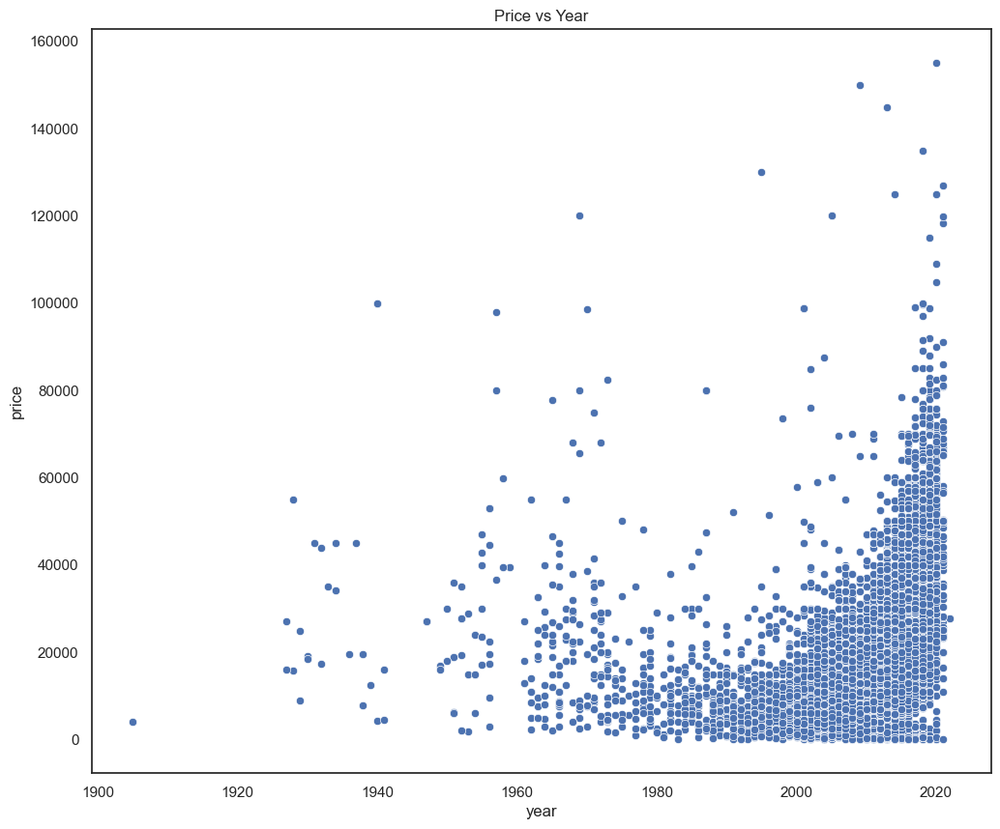

In [125]:
# show the correlation of price with year
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='year', y='price')
plt.title('Price vs Year')
plt.show()


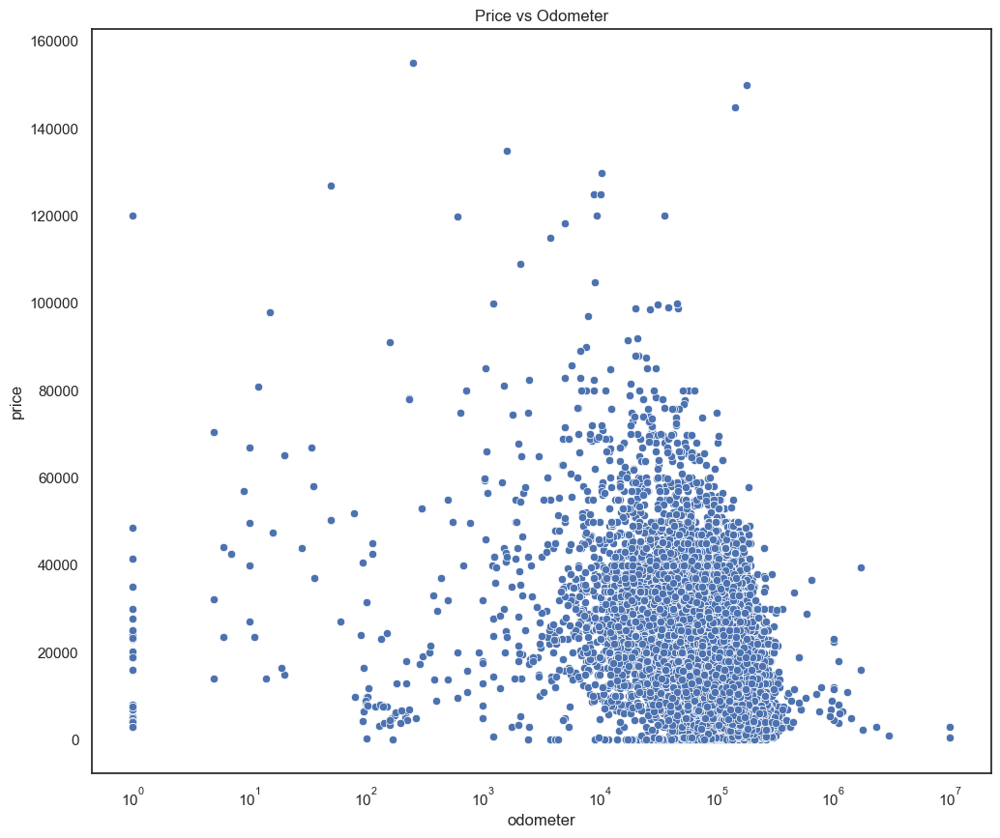

In [126]:
# show the correlation of price with odometer
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='odometer', y='price')
plt.xscale('log')
plt.title('Price vs Odometer')
plt.show()


/opt/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



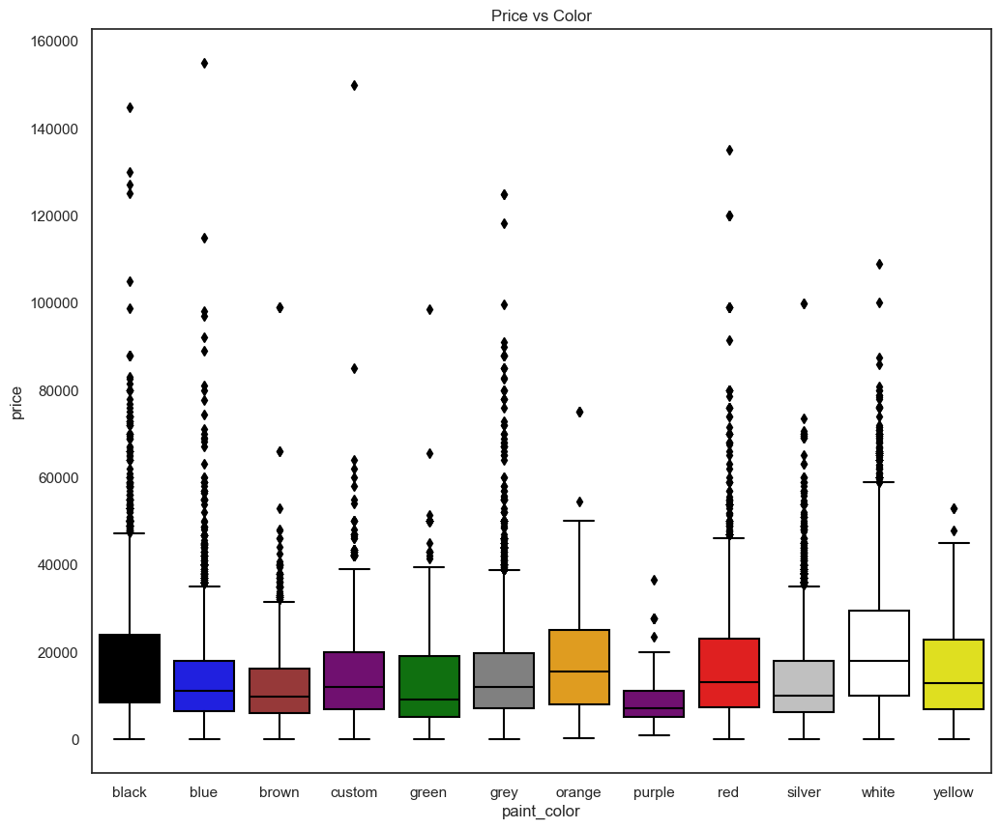

In [149]:
# Define the colors for each paint color in your data
color_palette = {
    'white': 'white',
    'black': 'black',
    'silver': 'silver',
    'grey': 'grey',
    'blue': 'blue',
    'red': 'red',
    'custom': 'purple',  # example for a 'custom' color
    'green': 'green',
    'brown': 'brown',
    'yellow': 'yellow',
    'orange': 'orange',
    'purple': 'purple'
}

#plot price versus color
plt.figure(figsize=(12, 10))
sns.boxplot(data=df_nonull, x='paint_color', y='price', palette=color_palette)
plt.title('Price vs Color')
plt.show()


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/4076639048.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observ

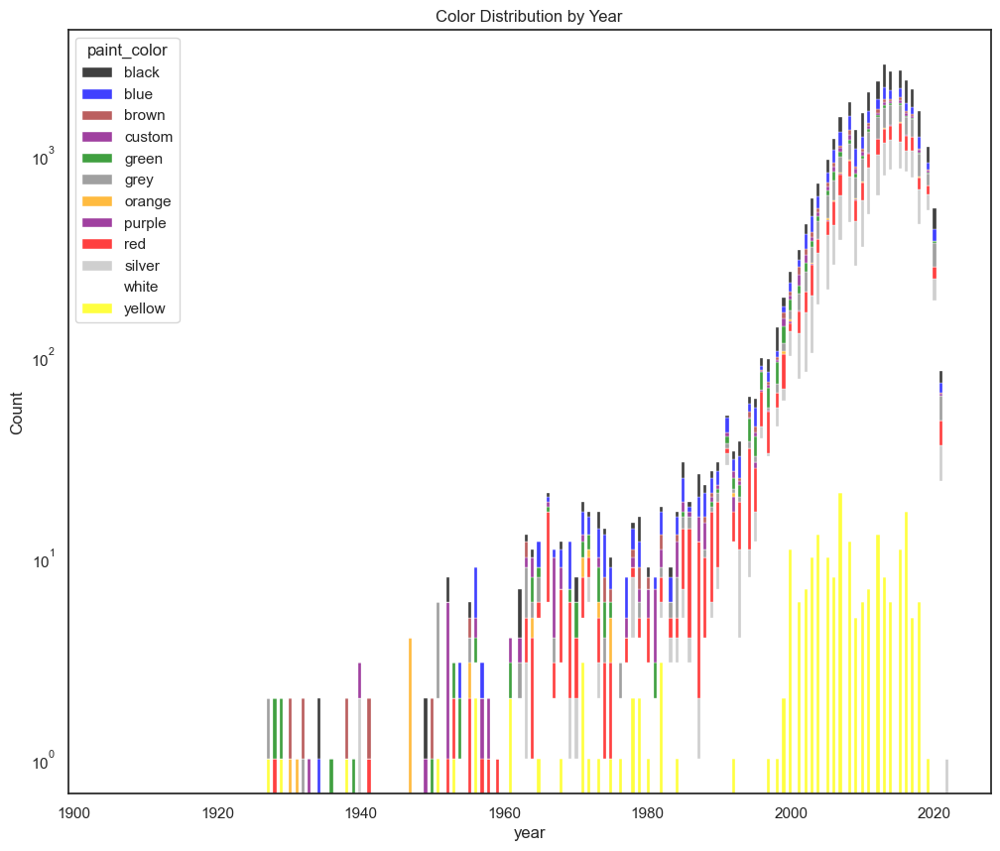

In [154]:

#group by 5 year intervals and plot the average price
df_nonull['year_group'] = pd.cut(df_nonull['year'], bins=range(1980, 2025, 5))
plt.figure(figsize=(12, 10))
sns.histplot(data=df_nonull, x='year', hue='paint_color', multiple='stack', palette=color_palette)
#make the y axis log scale
plt.yscale('log')
plt.title('Color Distribution by Year')
plt.show()


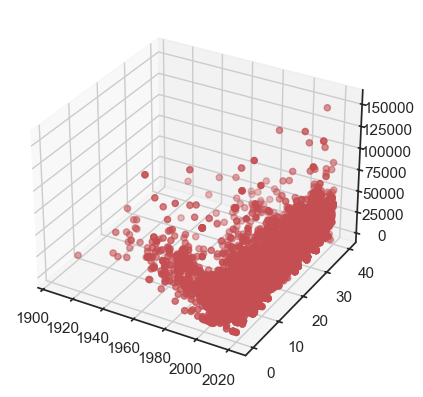

In [279]:
# draw a 3d plot of the price with the year and manufacturer using plotly
import plotly.express as px
fig = px.scatter_3d(df_nonull, x='year', y='mfr_encode', z='price', color='price')
fig.show()

# draw a 3d plot of the price with the year and manufacturer using matplotlib
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = df_nonull['year']
y = df_nonull['mfr_encode']
z = df_nonull['price']

ax.scatter(x, y, z, c='r', marker='o')
plt.show()


In [156]:
# show the average price by manufacturer by year
data = df_nonull
fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers+lines'))
fig.show()



In [157]:
def plots_by_year(data, subtitle):
    fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
    fig.update_traces(marker=dict(size=12,
                                  line=dict(width=2,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers+lines'))
    #set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.show()

    # plot a line graph of the average price by year and manufacturer
    data = data.groupby(['year', 'manufacturer'])['price'].mean().reset_index()
    fig = px.line(data, x='year', y='price', color='manufacturer')
    # set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.show()


In [276]:
plots_by_year(df_nonull, 'All Years')

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Conclusions / Hypotheses

Three distinct markets
1. Vintage before around 1980
    a. Specfic brands
    b. high premium on condition / mileage
2. Luxury / Exotic outliers
    a. high end
    b. small numbers
    c. price outliers
3. Mainstream market
    a. high correlation between year, mileage and price
    b. newer == higher
    

In [277]:
# separate the data into before and after 1980
df_1980 = df_nonull[df_nonull['year'] < 1980]
#print the count of rows in the dataset
print(f"Rows before 1980: {df_1980.count().max()}")
plots_by_year(df_1980, 'Before 1980')

df_recent = df_nonull[df_nonull['year'] >= 1980]
#print the count of rows in the dataset
print(f"Rows after 1980: {df_recent.count().max()}")
plots_by_year(df_recent, 'After 1980')

Rows before 1980: 304


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Rows after 1980: 32192


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [278]:

# create a new dataframe with outliers removed from df_recent
df_outliers = df_recent[df_recent['price'] > 50000]
df_core = df_recent[df_recent['price'] <= 50000]

print(f"Outliers: {df_outliers.count().max()}")
plots_by_year(df_outliers, 'Outliers after 1980')

print(f"Core: {df_core.count().max()}")
plots_by_year(df_core, 'Core after 1980')


Outliers: 649


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Core: 31543


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/2492672508.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Helper Functions


In [324]:
def plot_predictions(y_test, y_pred, title):

    # convert into dataframe
    df = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred})

    #re sort by y_test
    df_sorted = df.sort_values(by='y_test')

    y_test_sorted = df_sorted['y_test'].values
    y_pred_sorted = df_sorted['y_pred'].values

    # Plot the results as scatter plots
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(y_test_sorted)), y_test_sorted, label='Actual', marker='o', alpha=0.5, zorder=2)
    plt.scatter(np.arange(len(y_pred_sorted)), y_pred_sorted, label='Predicted', marker='x', alpha=1.0,zorder=1)
    plt.xlabel('Index (or Sample Number)')
    plt.ylabel('Target Value')
    plt.title(f'{title}: Comparison of Actual vs Predicted Values')
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [284]:
def perm_importance_with_transformed_columns(pipeline, estimator, X_test, y_test, title):
    # Step 1: Transform the test data using the preprocessing steps
    X_test_transformed = pipeline.named_steps['preprocessor'].transform(X_test)

    # Step 2: If you have PolynomialFeatures, apply that transformation too
    if 'poly' in pipeline.named_steps:
        X_test_transformed = pipeline.named_steps['poly'].transform(X_test_transformed)

    # Step 3: Calculate permutation importance on the transformed data
    result = permutation_importance(
        pipeline.named_steps[estimator],  # The final estimator in your pipeline
        X_test_transformed,             # The transformed test data
        y_test,
        n_repeats=10,
        random_state=42
    )

    # Step 4: Get the feature names from the transformed data
    if 'poly' in pipeline.named_steps:
        feature_names = pipeline.named_steps['poly'].get_feature_names_out(
            pipeline.named_steps['preprocessor'].get_feature_names_out()
        )
    else:
        feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()

    # Step 5: Display the permutation importance results for each feature
    sorted_idx = result.importances_mean.argsort()

    # Optional: Visualize the importance

    plt.figure(figsize=(10, 6))
    plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
    plt.title(f'{title}: Permutation Importance (Transformed Features)')
    plt.show()

# Model building

## Core group

### Split into test and train sets

In [185]:
# split df_core into X and y
df_core_nonan = df_core.dropna()

X = df_core_nonan.drop('price', axis=1)
y = df_core_nonan['price']
print(df_core_nonan.head())

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



             id      region  price  year   manufacturer       model  \
215  7316482063  birmingham   4000  2002         toyota        echo   
219  7316429417  birmingham   2500  1995            bmw        525i   
268  7315946365  birmingham   9000  2008          mazda  miata mx-5   
337  7315354216  birmingham   8950  2011           ford       f-150   
355  7315110575  birmingham   9400  2008  mercedes-benz   benz c350   

     condition    cylinders fuel  odometer  ...       size         type  \
215  excellent  4 cylinders  gas  155000.0  ...    compact        sedan   
219       fair  6 cylinders  gas  110661.0  ...   mid-size        sedan   
268  excellent  4 cylinders  gas   56700.0  ...    compact  convertible   
337  excellent  6 cylinders  gas  164000.0  ...  full-size        truck   
355       good  6 cylinders  gas  129473.0  ...  full-size        sedan   

    paint_color state mfr_encode num_cyl condition_encode color_encode  \
215        blue    al         38     4.0        

### Import the necessary libraries for modelling

In [413]:
# imports for modeling

from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.pipeline import make_pipeline
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel
from sklearn.metrics import mean_absolute_error



### Setup the preprocessor

In [241]:


# preprocess the data to scale numerical features 
preprocessor = make_column_transformer(
    (StandardScaler(), X.select_dtypes(include='number').columns.drop('id')),  
    #drop non-numeric columns
    remainder='drop'
)

# build a pipeline which includes polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)

# build a pipeline which includes the linear regression model
linear = LinearRegression()

# build a pipeline which includes the ridge regression model
ridge = Ridge()

# build a pipeline which includes the lasso regression model
lasso = Lasso()

### Initialize the results dataframe

In [262]:
#setup a results dictionary which will store the mse, rmse and r2 values for each model
results = {}


### Linear Regression with Scaling ###

In [416]:

# build a pipeline which includes the linear regression model with polynomial features and standard scaler
linear_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('linear', linear)
])

# fit the linear regression model with polynomial features
linear_scaled.fit(X_train, y_train)

# show the output column names from the preprocessor
print(preprocessor.get_feature_names_out())

# evaluate the linear regression model with polynomial features
linear_score = linear_scaled.score(X_test, y_test)

# caculate the mean squared error
y_pred = linear_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)


['standardscaler__year' 'standardscaler__odometer'
 'standardscaler__mfr_encode' 'standardscaler__num_cyl'
 'standardscaler__condition_encode' 'standardscaler__color_encode'
 'standardscaler__type_encode']


Linear Scaled R^2:  0.41756
Linear Scaled MSE:  75931209.04860
Linear Scaled RMSE:  8713.85156
Linear Scaled MAE:  6303.31338



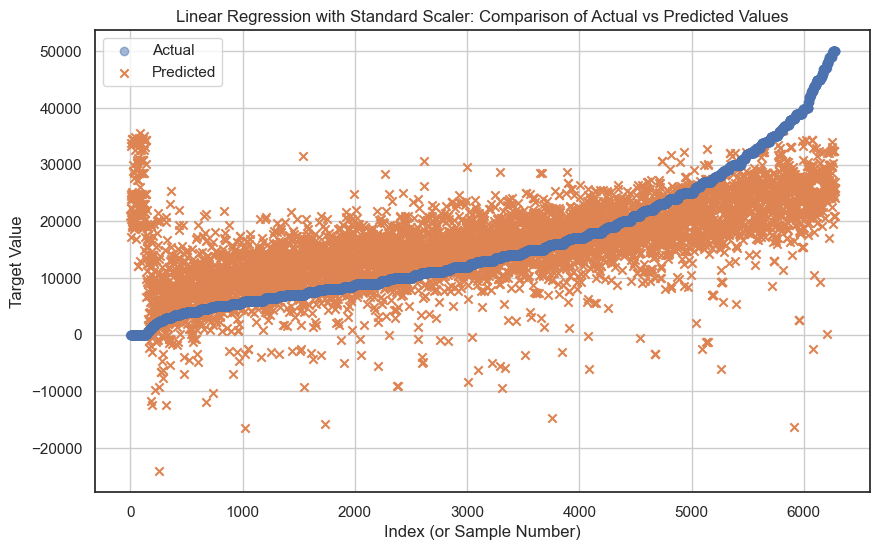

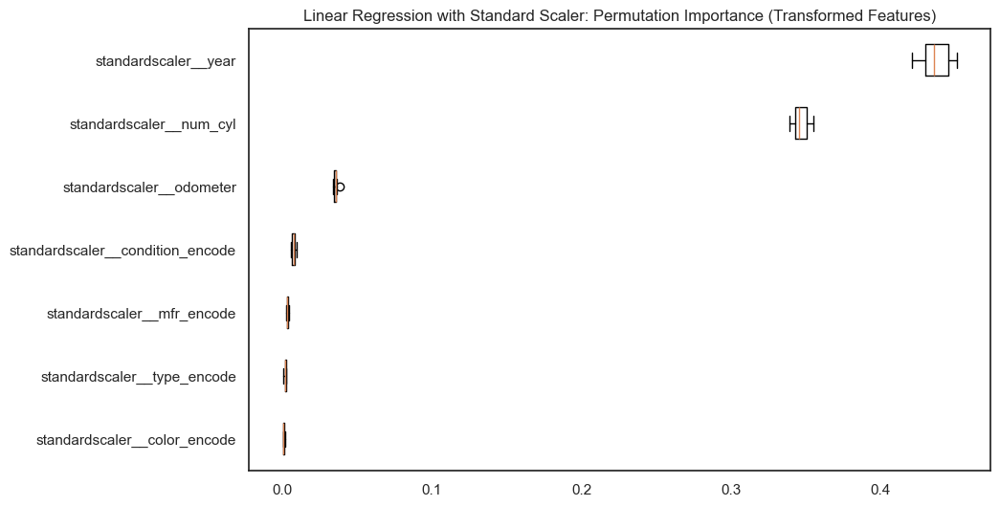

In [418]:


#append the results to the results dictionary
results['linear_scaled'] = {'r2': linear_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Linear Scaled R^2: {linear_score: .5f}')
print(f'Linear Scaled MSE: {mse: .5f}')
print(f'Linear Scaled RMSE: {rmse: .5f}')
print(f'Linear Scaled MAE: {mae: .5f}')
print()

# plot the predictions
plot_predictions(y_test, y_pred, 'Linear Regression with Standard Scaler')

# get the true perms
perm_importance_with_transformed_columns(linear_scaled, 'linear', X_test, y_test, 'Linear Regression with Standard Scaler')

### Ridge with Scaling ###

Ridge Scaled R^2:  0.41756
Ridge Scaled MSE:  75931407.32794
Ridge Scaled RMSE:  8713.86294
Ridge Scaled MAE:  6303.35225



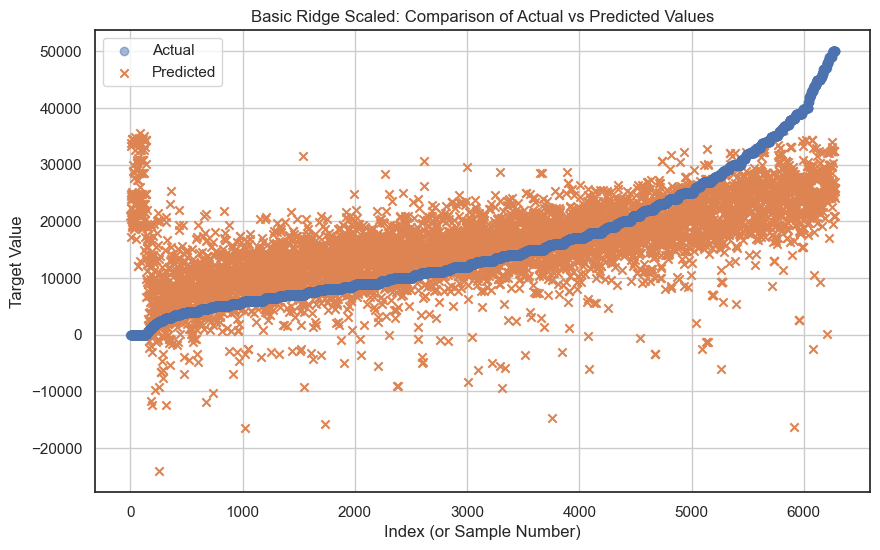

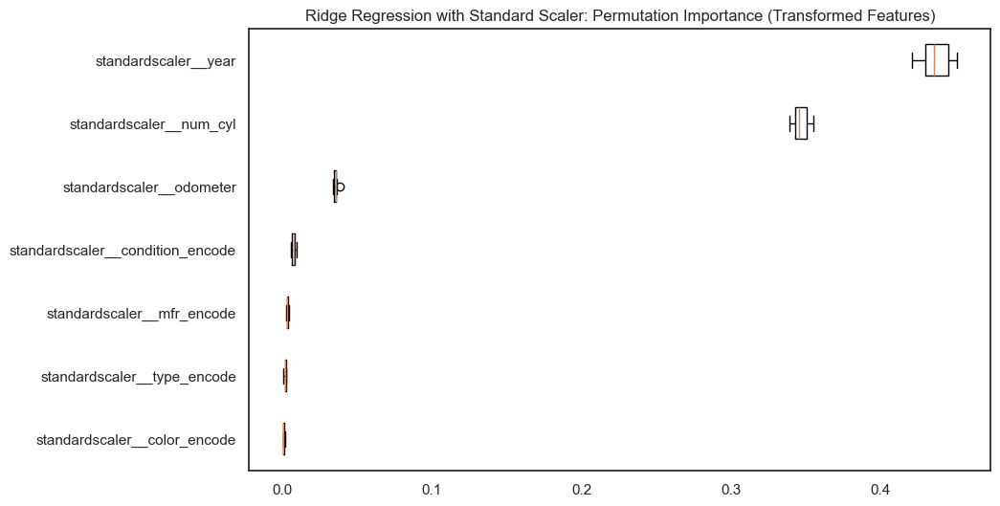

In [426]:
# build a pipeline which includes the ridge regression model with polynomial features and standard scaler
ridge_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('ridge', ridge)
])

# fit the ridge regression model with polynomial features
ridge_scaled.fit(X_train, y_train)

# evaluate the ridge regression model with polynomial features
ridge_score = ridge_scaled.score(X_test, y_test)

# caculate the mean squared error
y_pred = ridge_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results['ridge_scaled'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Ridge Scaled R^2: {ridge_score: .5f}')
print(f'Ridge Scaled MSE: {mse: .5f}')
print(f'Ridge Scaled RMSE: {rmse: .5f}')
print(f'Ridge Scaled MAE: {mae: .5f}')
print()

#plot the predictions
plot_predictions(y_test, y_pred, 'Basic Ridge Scaled')

# get the true perms
perm_importance_with_transformed_columns(ridge_scaled, 'ridge', X_test, y_test, 'Ridge Regression with Standard Scaler')


### Ridge with different alphas

In [428]:

#compare different amounts of regularization
alphas = np.logspace(-4, 4, 9)

# Set up the hyperparameter grid for alpha values
param_grid = {
    'ridge__alpha': [0.1, 1.0, 10, 100]  # specify the alpha values to search over
}

# Use GridSearchCV to search over the specified alpha values
grid_search = GridSearchCV(ridge_scaled, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model using the training data
grid_search.fit(X_train, y_train)

# Get the best model with the optimal alpha
best_model = grid_search.best_estimator_

# Evaluate the best model on the test data
ridge_score = best_model.score(X_test, y_test)



Best alpha: 100
Best Ridge Score:  0.41740
Best Mean Squared Error:  75951922.56736
Best Root Mean Squared Error:  8715.04002
Best Mean Absolute Error:  6307.25611


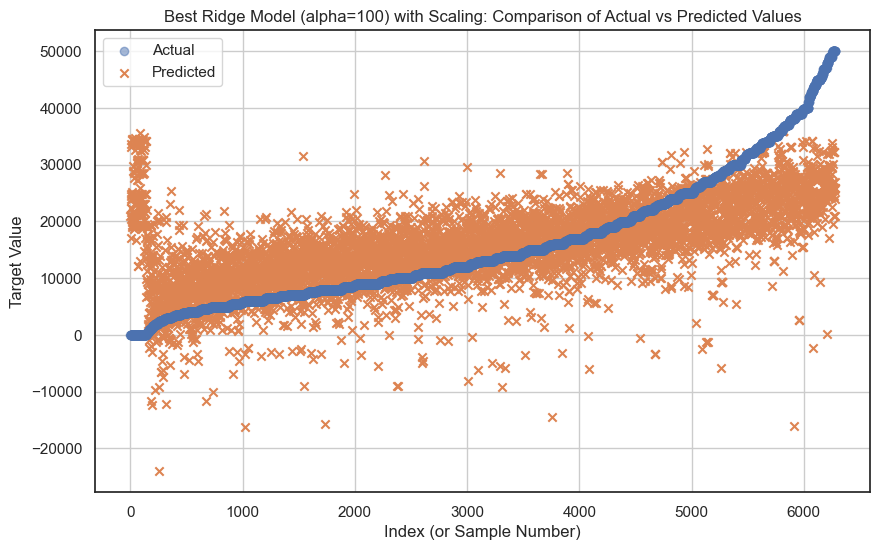

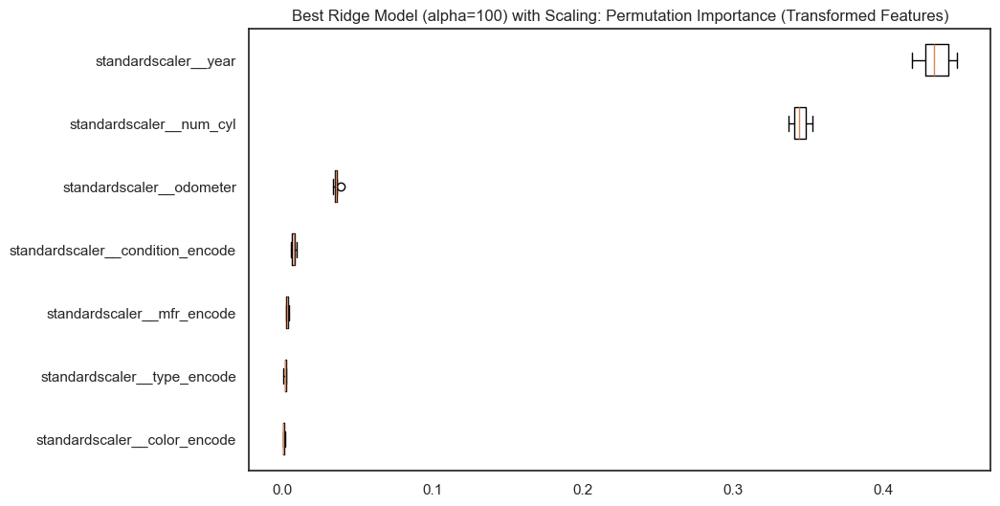

In [429]:


# Calculate the mean squared error for the best model
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results['ridge_scaled_best'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

best_alpha = grid_search.best_params_['ridge__alpha']

# Print the results
print(f"Best alpha: {grid_search.best_params_['ridge__alpha']}")
print(f'Best Ridge Score: {ridge_score: .5f}')
print(f'Best Mean Squared Error: {mse: .5f}')
print(f'Best Root Mean Squared Error: {rmse: .5f}')
print(f'Best Mean Absolute Error: {mae: .5f}')


# Plot the predictions
plot_predictions(y_test, y_pred, f'Best Ridge Model (alpha={best_alpha}) with Scaling')

# get the true perms
perm_importance_with_transformed_columns(best_model, 'ridge', X_test, y_test, f'Best Ridge Model (alpha={best_alpha}) with Scaling')

### Lasso with scaling

Lasso Scaled R^2:  0.41755
Lasso Scaled MSE:  75933232.76918
Lasso Scaled RMSE:  8713.96768
Lasso Scaled MAE:  6303.50958



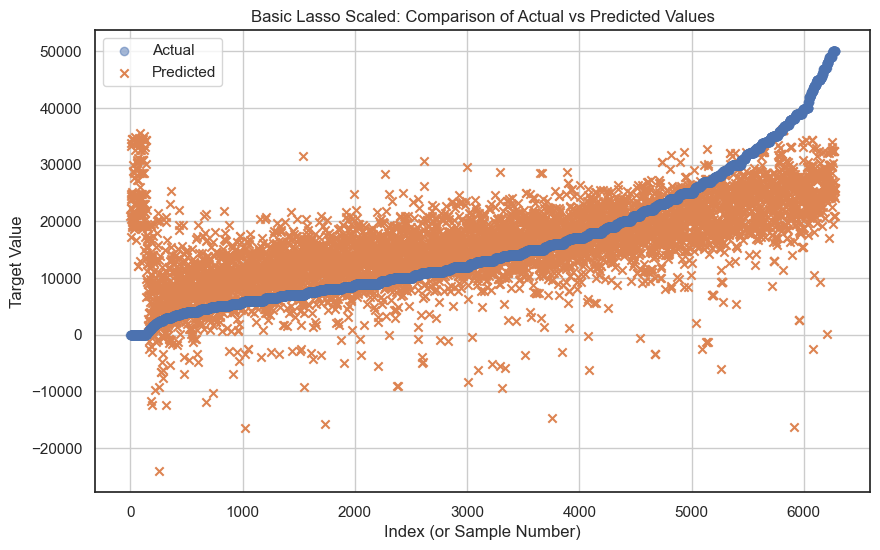

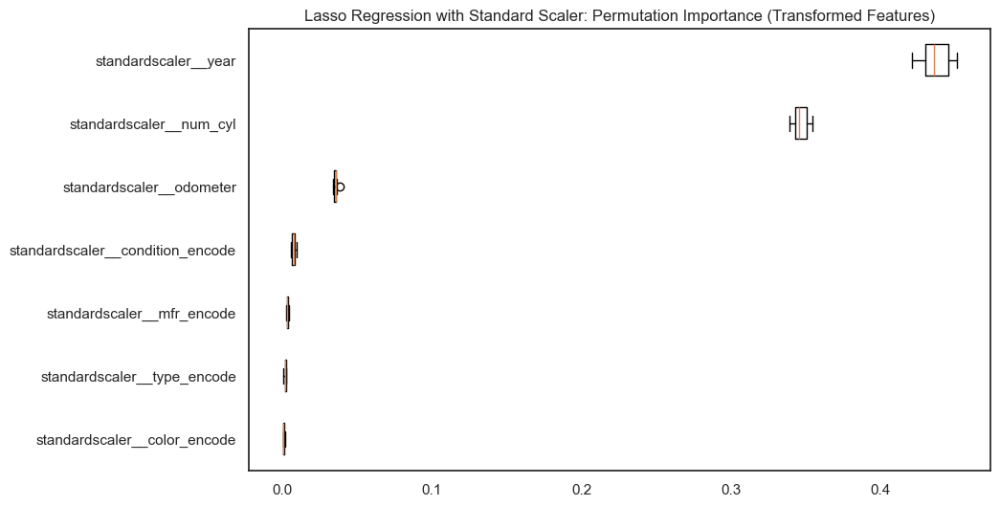

In [430]:
# build a pipeline which includes the lasso regression model with standard scaler

lasso_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('lasso', lasso)
])

# fit the lasso regression model with polynomial features
lasso_scaled.fit(X_train, y_train)

# evaluate the lasso regression model with polynomial features
lasso_score = lasso_scaled.score(X_test, y_test)

# caculate the mean squared error
y_pred = lasso_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results['lasso_scaled'] = {'r2': lasso_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Lasso Scaled R^2: {lasso_score: .5f}')
print(f'Lasso Scaled MSE: {mse: .5f}')
print(f'Lasso Scaled RMSE: {rmse: .5f}')
print(f'Lasso Scaled MAE: {mae: .5f}')
print()

#plot the predictions
plot_predictions(y_test, y_pred, 'Basic Lasso Scaled')

# get the true perms
perm_importance_with_transformed_columns(lasso_scaled, 'lasso', X_test, y_test, 'Lasso Regression with Standard Scaler')


### Lasso with different alphas


Best alpha: 100
Model R^2 score:  0.41549
Mean Squared Error:  76201332.74552
Root Mean Squared Error:  8729.33747
Mean Absolute Error:  6326.62932


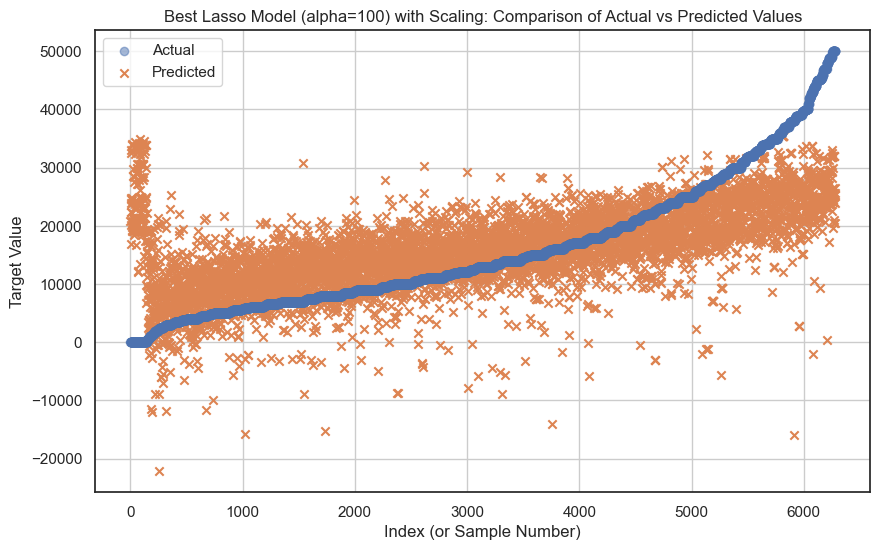

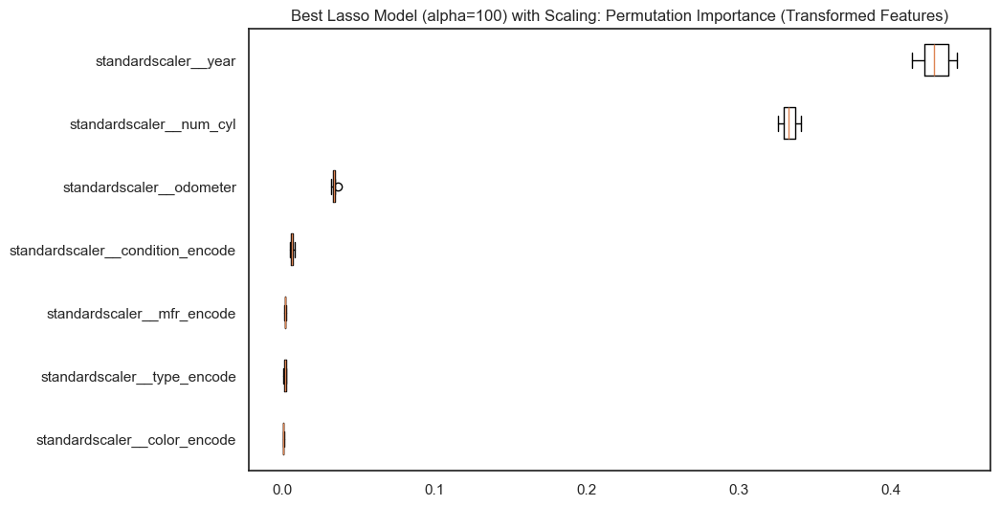

In [431]:
# Define the hyperparameter grid for alpha values
param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10, 100, 1000]  # Alpha values to test
}

# Set up the GridSearchCV with cross-validation
grid_search = GridSearchCV(lasso_scaled, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model using GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model and alpha
best_model = grid_search.best_estimator_
best_alpha = grid_search.best_params_['lasso__alpha']

# Evaluate the best model on the test set
ridge_score = best_model.score(X_test, y_test)

# Calculate the mean squared error for the best model
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

# Append the results to the results dictionary
results['lasso_scaled_best'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

# Print results
print(f"Best alpha: {best_alpha}")
print(f"Model R^2 score: {ridge_score: .5f}")
print(f"Mean Squared Error: {mse: .5f}")
print(f"Root Mean Squared Error: {rmse: .5f}")
print(f"Mean Absolute Error: {mae: .5f}")

# Get the model predictions for X_test
y_pred = best_model.predict(X_test)

# Plot the predictions
plot_predictions(y_test, y_pred, f'Best Lasso Model (alpha={best_alpha}) with Scaling')

# get the true perms
perm_importance_with_transformed_columns(best_model, 'lasso', X_test, y_test, f'Best Lasso Model (alpha={best_alpha}) with Scaling')



### Find the most important features and build a poly regression model

### GridSearch with Ridge

Best alpha: 719.6856730011522

                            Feature  Coefficient  Abs Coefficient
0              standardscaler__year  5076.626460      5076.626460
3           standardscaler__num_cyl  4499.375512      4499.375512
1          standardscaler__odometer -1424.124043      1424.124043
4  standardscaler__condition_encode   794.661526       794.661526
6       standardscaler__type_encode   424.163698       424.163698
2        standardscaler__mfr_encode   359.184665       359.184665
5      standardscaler__color_encode   302.001038       302.001038

Intercept: 15931.280020703934
Ridge Train MSE:  74380237.98334
Ridge Train RMSE:  8624.39783
Ridge Test MSE:  76117185.57839
Ridge Test RMSE:  8724.51635
Ridge Test MAE:  6333.14788


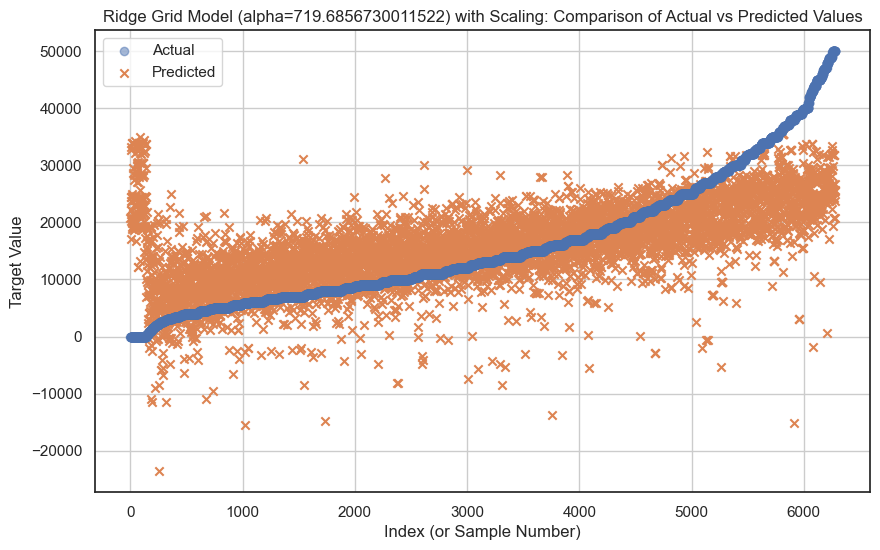

In [432]:
ridge_param_dict = {'ridge__alpha': np.logspace(0, 10, 50)}
ridge_pipe = Pipeline([('preprocessor', preprocessor),
                    ('scaler', StandardScaler()), 
                      ('ridge', Ridge())])
ridge_grid = GridSearchCV(ridge_pipe, param_grid=ridge_param_dict)
ridge_grid.fit(X_train, y_train)

# Get the best model from grid search
best_pipeline = ridge_grid.best_estimator_
best_alpha = best_pipeline.named_steps['ridge'].alpha
print(f"Best alpha: {best_alpha}")
print()

# Extract the Ridge model from the pipeline
best_ridge = best_pipeline.named_steps['ridge']

# Get the coefficients of the best model
coefficients = best_ridge.coef_
intercept = best_ridge.intercept_

# Print the coefficients with column names
#get the column names from the preprocessor
columns = best_pipeline.named_steps['preprocessor'].get_feature_names_out()
coefficients_df = pd.DataFrame({'Feature': columns, 'Coefficient': coefficients, 'Abs Coefficient': np.abs(coefficients)})
coefficients_df_sorted = coefficients_df.reindex(coefficients_df['Coefficient'].abs().sort_values(ascending=False).index)

print(coefficients_df_sorted)
print()
print("Intercept:", intercept)

ridge_train_preds = ridge_grid.predict(X_train)
ridge_test_preds = ridge_grid.predict(X_test)
ridge_train_mse = mean_squared_error(y_train, ridge_train_preds)
ridgr_train_rmse = np.sqrt(ridge_train_mse)
ridge_test_mse = mean_squared_error(y_test, ridge_test_preds)
ridge_test_rmse = np.sqrt(ridge_test_mse)
ridge_test_mae = mean_absolute_error(y_test, ridge_test_preds)

#append the results to the results dictionary
results['ridge_grid'] = {'r2': ridge_grid.score(X_test, y_test), 'mse': ridge_test_mse, 'rmse': ridge_test_rmse, 'mae': ridge_test_mae}

print(f"Ridge Train MSE: {ridge_train_mse: .5f}")
print(f"Ridge Train RMSE: {ridgr_train_rmse: .5f}")
print(f"Ridge Test MSE: {ridge_test_mse: .5f}")
print(f"Ridge Test RMSE: {ridge_test_rmse: .5f}")
print(f"Ridge Test MAE: {ridge_test_mae: .5f}")

# Plot the predictions
plot_predictions(y_test, ridge_test_preds, f'Ridge Grid Model (alpha={best_alpha}) with Scaling')



### SFS with Poly

In [398]:
# Assuming preprocessor is already defined elsewhere in your code
sequential_pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('poly_features', PolynomialFeatures(include_bias=False)),
    ('selector', SequentialFeatureSelector(LinearRegression())),
    ('linreg', LinearRegression())
])

# Define the parameter grid for the grid search
param_grid = {
    'poly_features__degree': [1,2,3],  # List of degrees to try for the polynomial features
    'selector__n_features_to_select': [3, 4, 5, 6]  # List of n_features_to_select values to try
}

# Set up the grid search with cross-validation
grid_search = GridSearchCV(sequential_pipe, param_grid, scoring='neg_mean_squared_error', cv=None, verbose=2)

# Fit the grid search to the data (X, y should be defined as your features and target variables)
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# You can also get the best estimator (pipeline) and use it for predictions
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.1s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=5; t

In [440]:
# re run with just the best parameters

sequential_pipe = Pipeline([('preprocessor', preprocessor),
                            ('poly_features', PolynomialFeatures(degree=4, include_bias = False)),
                           ('selector', SequentialFeatureSelector(LinearRegression(), 
                                                                  n_features_to_select=6)),
                           ('linreg', LinearRegression())])
sequential_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['year', 'odometer', 'mfr_encode', 'num_cyl', 'condition_encode',
       'color_encode', 'type_encode'],
      dtype='object'))])),
                ('poly_features',
                 PolynomialFeatures(degree=4, include_bias=False)),
                ('selector',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           n_features_to_select=6)),
                ('linreg', LinearRegression())])

In [441]:
# Extract feature names after the preprocessor step
preprocessed_columns = sequential_pipe.named_steps['preprocessor'].get_feature_names_out()

# Generate polynomial feature names (manually for better understanding)
poly = sequential_pipe.named_steps['poly_features']
poly_feature_names = poly.get_feature_names_out(preprocessed_columns)

# Get the indices of the selected features
selector = sequential_pipe.named_steps['selector']
selected_indices = selector.get_support(indices=True)

# Get the names of the selected columns after polynomial feature generation
selected_columns = poly_feature_names[selected_indices]

# Get the coefficients from the linear regression model
coefficients = sequential_pipe.named_steps['linreg'].coef_

# Combine column names with coefficients for easy viewing
selected_features_with_coefficients = list(zip(selected_columns, coefficients))

# Display selected features with their coefficients
for feature, coef in selected_features_with_coefficients:
    print(f"Feature: {feature}, Coefficient: {coef}")




Feature: standardscaler__year, Coefficient: 7723.7728655524725
Feature: standardscaler__num_cyl, Coefficient: 6929.288103935565
Feature: standardscaler__year^2, Coefficient: 1611.5798086195791
Feature: standardscaler__num_cyl^3, Coefficient: -1189.2205360319215
Feature: standardscaler__odometer standardscaler__num_cyl^2 standardscaler__condition_encode, Coefficient: -1548.393942084157
Feature: standardscaler__num_cyl^3 standardscaler__condition_encode, Coefficient: 532.1063046886115


In [442]:

sequential_train_mse = mean_squared_error(y_train, sequential_pipe.predict(X_train))
sequential_train_rmse = np.sqrt(sequential_train_mse)
sequential_test_mse = mean_squared_error(y_test, sequential_pipe.predict(X_test))
sequential_test_rmse = np.sqrt(sequential_test_mse)
sequential_test_mae = mean_absolute_error(y_test, sequential_pipe.predict(X_test))  

#append the results to the results dictionary
name = f'sequential(degree=3, n_features=6)'
results[name] = {'r2': sequential_pipe.score(X_test, y_test), 'mse': sequential_test_mse, 'rmse': sequential_test_rmse, 'mae': sequential_test_mae}

print(f'Sequential Train RMSE = {sequential_train_rmse}')
print(f'Sequential Test RMSE = {sequential_test_rmse}')
print(f'Sequential Train MSE = {sequential_train_mse}')
print(f'Sequential Test RMSE = {sequential_test_rmse}')
print(f'Sequential Test MAE = {sequential_test_mae}')

Sequential Train RMSE = 7924.693577859967
Sequential Test RMSE = 8119.189643528401
Sequential Train MSE = 62800768.302975014
Sequential Test RMSE = 8119.189643528401
Sequential Test MAE = 5860.050982627719


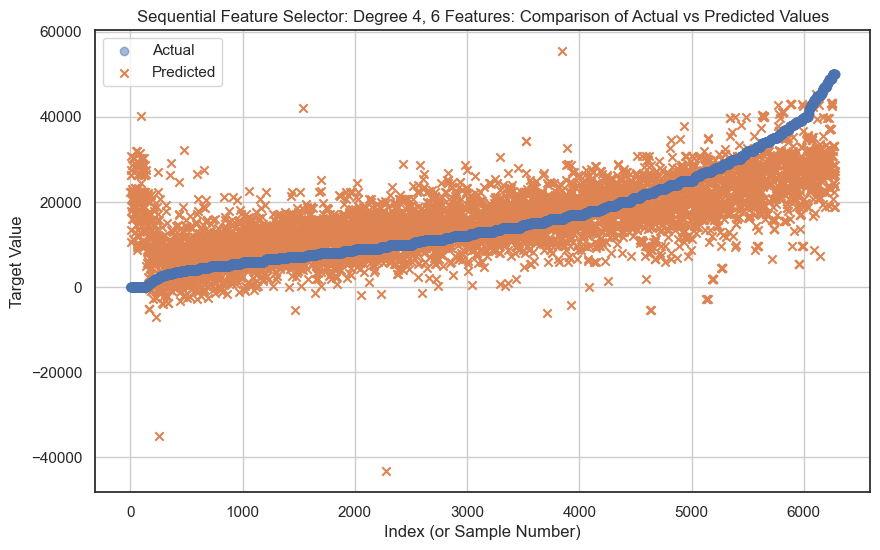

In [443]:


# plot the predictions against the test data
plot_predictions(y_test, sequential_pipe.predict(X_test), 'Sequential Feature Selector: Degree 4, 6 Features')


In [444]:
# create a dataframe from the results dictionary and print it
results_df = pd.DataFrame(results).T
print(results_df)

                                          r2           mse         rmse  \
linear_scaled                       0.417561  7.593121e+07  8713.851562   
ridge_scaled                        0.417560  7.593141e+07  8713.862939   
ridge_scaled_best                   0.417402  7.595192e+07  8715.040021   
lasso_scaled                        0.417546  7.593323e+07  8713.967682   
ridge_grid                          0.416135  7.611719e+07  8724.516352   
lasso_scaled_best                   0.415489  7.620133e+07  8729.337475   
sequential(degree=4, n_features=6)  0.489782  6.651587e+07  8155.726405   
sequential(degree=3, n_features=6)  0.494344  6.592124e+07  8119.189644   

                                            mae  
linear_scaled                       6303.313376  
ridge_scaled                        6303.352247  
ridge_scaled_best                   6307.256107  
lasso_scaled                        6303.509576  
ridge_grid                          6333.147876  
lasso_scaled_best       

In [448]:
#what is the average price for the test set
average_price = y_test.mean()
print(f"Average Price: {average_price}")

#calculate the percentage error for each model
results_df['percent_error'] = round((100 * (results_df['mae'] / average_price)), 2)

# round all of the values to 2 decimal places
results_df = results_df.round(2)

#drop the mse column
results_df = results_df.drop('mse', axis=1)

#sort the dataframe by percent error
results_df = results_df.sort_values(by='percent_error')

print(results_df)

Average Price: 16051.524287306896
                                      r2     rmse      mae  percent_error
sequential(degree=3, n_features=6)  0.49  8119.19  5860.05          36.51
sequential(degree=4, n_features=6)  0.49  8155.73  5898.71          36.75
linear_scaled                       0.42  8713.85  6303.31          39.27
ridge_scaled                        0.42  8713.86  6303.35          39.27
lasso_scaled                        0.42  8713.97  6303.51          39.27
ridge_scaled_best                   0.42  8715.04  6307.26          39.29
lasso_scaled_best                   0.42  8729.34  6326.63          39.41
ridge_grid                          0.42  8724.52  6333.15          39.46


# Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

#### Modeling 
In spite of having exhaustively searched the model space for the models I know how to build, I am not very satisfied with the rmse of $8119.19 against an average price of $16051.52.

The models have all selected the same top factors, which should reflect consistent analysis of the data, but the error is still very high.

Update: I went back and calculate the mean absolute error for each model output, and that is a lot better.  For the winning SFS with poly degree 4, this yields $5860.05 which is 36.51% of the average price.  Still not great, but improved.

Next step: try adding columns that weren't included in the modelling.


### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.